# Part 1. Segmentation — 10 points

### Task

Train a neural network to segment cells edges.

In this task, you won't be provided with any code snippets, just input data and target metric — intersection-over-union (IoU) (see the implementation below).

You should train your neural network to predict a mask of edge pixels (pixels in gt images with value greater than 0).

Use everything you have learnt by now: 
* any architectures for semantic segmentation (encoder-decoder like or based on dilated convolutions), we recommend using UNet: https://towardsdatascience.com/unet-line-by-line-explanation-9b191c76baf5)
* data augmentation (you will need that since train set consists of just 41 images)
* fine-tuning

You are not allowed to do only one thing: to train you network on a test set.

The final solution will consist of an ipython notebook with code (for final network training + any experiments with data) and an archive with png images with network predictions for test images (one-channel images, 0 - for non-edge pixels, any non-zero value for edge pixels).

A good network should be able to segment images with iou >= 0.29. This is not a strict criterion of full points solution, but try to obtain similar or better numbers.

Practical notes:
* There is a hard data class imbalance in dataset, so the network output will be biased toward "zero" class. You can either tune the minimal probability threshold for "edge" class, or add class weights to increase the cost of edge pixels in optimized loss.
* Dataset is small so actively use data augmentation: rotations, flip, random contrast and brightness
* Better spend time on experiments with neural network than on postprocessing tricks (i.e test set augmentation).
* Keep in mind that network architecture defines receptive field of pixel. If the size of network input is smaller than receptive field of output pixel, than probably you can throw some layers without loss of quality. It is ok to modify "of-the-shelf" architectures. 

Good luck!

In [1]:
! rm BBBC018_v1_images-fixed -rf
! rm BBBC018_v1_outlines -rf

### Download the dataset ###
!wget https://www.dropbox.com/s/jy34yowcf85ydba/data.zip?dl=0 -O data.zip
!unzip -q data.zip

! mkdir BBBC018_v1_images-fixed/train/0 && mv BBBC018_v1_images-fixed/train/*.bmp BBBC018_v1_images-fixed/train/0
! mkdir BBBC018_v1_images-fixed/val/0 && mv BBBC018_v1_images-fixed/val/*.bmp BBBC018_v1_images-fixed/val/0
! mkdir BBBC018_v1_images-fixed/test/0 && mv BBBC018_v1_images-fixed/test/*.bmp BBBC018_v1_images-fixed/test/0

! mkdir BBBC018_v1_outlines/train/0 && mv BBBC018_v1_outlines/train/*.png BBBC018_v1_outlines/train/0
! mkdir BBBC018_v1_outlines/val/0 && mv BBBC018_v1_outlines/val/*.png BBBC018_v1_outlines/val/0

--2020-05-12 12:59:54--  https://www.dropbox.com/s/jy34yowcf85ydba/data.zip?dl=0
Resolving www.dropbox.com (www.dropbox.com)... 162.125.65.1, 2620:100:6021:1::a27d:4101
Connecting to www.dropbox.com (www.dropbox.com)|162.125.65.1|:443... connected.
HTTP request sent, awaiting response... 301 Moved Permanently
Location: /s/raw/jy34yowcf85ydba/data.zip [following]
--2020-05-12 12:59:55--  https://www.dropbox.com/s/raw/jy34yowcf85ydba/data.zip
Reusing existing connection to www.dropbox.com:443.
HTTP request sent, awaiting response... 302 Found
Location: https://ucdee13ce1c0c5912ac5213aa310.dl.dropboxusercontent.com/cd/0/inline/A3kaECoEk0ETyTa_Ql9u78_MI_CFGegWDGBH2OoE7_QURCuxLTUNTtA-rLcYZkGnijx4hjAoSgTS-h1NsFn78MfpGZI9lAEYTIRcGY_rHK9SRg/file# [following]
--2020-05-12 12:59:55--  https://ucdee13ce1c0c5912ac5213aa310.dl.dropboxusercontent.com/cd/0/inline/A3kaECoEk0ETyTa_Ql9u78_MI_CFGegWDGBH2OoE7_QURCuxLTUNTtA-rLcYZkGnijx4hjAoSgTS-h1NsFn78MfpGZI9lAEYTIRcGY_rHK9SRg/file
Resolving ucdee13ce1c0c

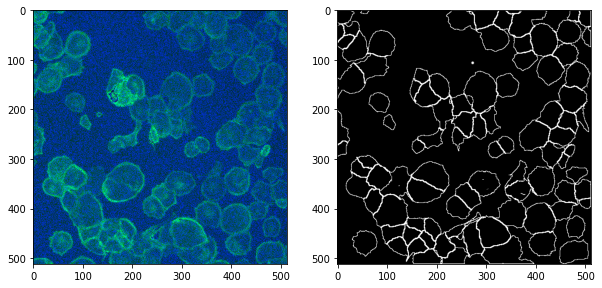

In [2]:
### Visualize the data ###
import matplotlib.pyplot as plt
import numpy as np
import skimage
from skimage import io
%matplotlib inline



# Human HT29 colon-cancer cells
plt.figure(figsize=(10,8))
plt.subplot(1,2,1)
im = skimage.img_as_ubyte(io.imread('BBBC018_v1_images-fixed/train/0/00735-actin.DIB.bmp'))
plt.imshow(im)
plt.subplot(1,2,2)
mask = skimage.img_as_ubyte(io.imread('BBBC018_v1_outlines/train/0/00735-cells.png'))
plt.imshow(mask, 'gray');

In [0]:
### Target metric ###
def calc_iou(prediction, ground_truth):
    n_images = len(prediction)
    intersection, union = 0, 0
    for i in range(n_images):
        intersection += np.logical_and(prediction[i] > 0, ground_truth[i] > 0).astype(np.float32).sum() 
        union += np.logical_or(prediction[i] > 0, ground_truth[i] > 0).astype(np.float32).sum()
    return float(intersection) / union

In [0]:
# YOUR CODE HERE

In [0]:
### Target metric ###
def calc_iou_torch(prediction, ground_truth):
    n_images = len(prediction)
    intersection = torch.tensor(0)
    union = torch.tensor(0)
    for i in range(n_images):
        intersection = intersection + ((prediction[i] > 0) & (ground_truth[i] > 0)).type(torch.float32).sum() 
        union = union + ((prediction[i] > 0) | (ground_truth[i] > 0)).type(torch.float32).sum()
    return float(intersection) / union

In [6]:
import os

from tqdm.notebook import tqdm    # run this in Colab
# from tqdm import tqdm               # or this in Jupyter instead

import torch
from torch import nn
from torch.utils.data import DataLoader
from torch.utils.tensorboard import SummaryWriter

import torchvision
from torchvision import transforms

from datetime import datetime

!pip install einops
from einops import rearrange

import random

In [0]:
device = torch.device("cuda") if torch.cuda.is_available() else torch.device("cpu")

batch_size = 4
val_batch_size = 1
image_size = 256

X_dir = "./BBBC018_v1_images-fixed"
y_dir = "./BBBC018_v1_outlines"

transform = { "train": transforms.Compose([
                  # transforms.Resize(size=image_size),
                  # transforms.RandomCrop(image_size, padding=4),
                  # transforms.RandomHorizontalFlip(),
                  # transforms.RandomRotation(10),
                  # transforms.ColorJitter(brightness=0.1, contrast=0.1, saturation=0.05, hue=0.05),
                  transforms.ToTensor(),
                  transforms.Normalize(mean=[0.5, 0.5, 0.5], std=[0.5, 0.5, 0.5]),
              ]),
              "val": transforms.Compose([
                  # transforms.Resize(size=image_size),
                  # transforms.RandomCrop(image_size, padding=4),
                  # transforms.RandomHorizontalFlip(),
                  # transforms.RandomRotation(10),
                  # transforms.ColorJitter(brightness=0.1, contrast=0.1, saturation=0.05, hue=0.05),
                  transforms.ToTensor(),
              ])
            }

In [0]:
# from seminar_photo2map_solution.ipynp
def imshow(img):
    img = img / 2 + 0.5  # unnormalize
    img = img.cpu().numpy()
    
    # img_reshaped = np.transpose(img, (1, 2, 0))

    # below we use einops.rearrange. You can read about this neat library here: https://github.com/arogozhnikov/einops/blob/master/docs/1-einops-basics.ipynb
    img_reshaped = rearrange(img, 'channels height width -> height width channels')
    
    plt.imshow(img_reshaped)
    plt.show()

In [0]:
def make_tuples(X, y):
    return [(xi, yi) for xi, yi in zip(X, y)]

In [62]:
X_train = torchvision.datasets.ImageFolder(os.path.join(X_dir, "train"), transform=transform["train"])
X_val = torchvision.datasets.ImageFolder(os.path.join(X_dir, "val"), transform=transform["train"])
X_test = torchvision.datasets.ImageFolder(os.path.join(X_dir, "test"), transform=transform["train"])

y_train = torchvision.datasets.ImageFolder(os.path.join(y_dir, "train"), transform=transform["val"])
y_val = torchvision.datasets.ImageFolder(os.path.join(y_dir, "val"), transform=transform["val"])

X_train = [i[0] for i in X_train]
X_val = [i[0] for i in X_val]
X_test = [i[0] for i in X_test]
y_train = [i[0][:1] for i in y_train]
y_val = [i[0][:1] for i in y_val]

train_dataset = make_tuples(X_train, y_train)
val_dataset = make_tuples(X_val, y_val)

train_batch_gen = DataLoader(train_dataset, batch_size=batch_size, shuffle=True, num_workers=2)
val_batch_gen = DataLoader(val_dataset, batch_size=val_batch_size, shuffle=False, num_workers=1)

print(f"{len(X_train)} training images")
print(f"{len(X_val)} validation images")
print(f"{len(X_test)} testing images")

41 training images
7 validation images
7 testing images


In [0]:
# imshow(train_dataset[1][0])
# plt.imshow(train_dataset[1][1][0])

In [0]:
# UNetDownBlock: Conv + ReLU + Conv + ReLU + MaxPool

class UnetDownBlock(nn.Module):
    def __init__(self, in_channels, out_channels, pooling=True):
        super().__init__()
        
        self.convs = nn.Sequential(
            nn.Conv2d(in_channels, out_channels, kernel_size=3, padding=1),
            nn.ReLU(),
            nn.Conv2d(out_channels, out_channels, kernel_size=3, padding=1),
            nn.ReLU(),
        )
        self.maxpool = nn.MaxPool2d(kernel_size=2)
        
    def forward(self, x):
        # x: a tensor of shape (batch_size, in_channels, layer_height, layer_width)
        
        out_before_pooling = self.convs(x)
        out = self.maxpool(out_before_pooling)

        return out, out_before_pooling

In [0]:
# UNetUpBlock: upsampling + concat + Conv + ReLU

class UnetUpBlock(nn.Module):
    def __init__(self, in_channels, out_channels):
        super().__init__()
        
        self.upsample = nn.Upsample(scale_factor=2)
        self.convs = nn.Sequential(
            nn.Conv2d(in_channels * 2, out_channels, kernel_size=3, padding=1),
            nn.ReLU(),
            nn.Conv2d(out_channels, out_channels, kernel_size=3, padding=1),
            nn.ReLU(),
        )
        
    def forward(self, x, x_bridge):
        # x: a tensor of shape (batch_size, in_channels, layer_height // 2, layer_width // 2)
        # x_bridge: a tensor of shape (batch_size, in_channels, layer_height, layer_width)
        
        x_up = self.upsample(x)
        x_concat = torch.cat([x_up, x_bridge], dim=1)
        out = self.convs(x_concat)
        
        return out

In [0]:
### Let's make a UNet with 5 levels and 64, 128, 256, 256, 256 channels
### (n_base_channels=64)

class Unet(nn.Module):
    def __init__(self, n_base_channels=64):
        super().__init__()
        
        self.down_blocks = nn.ModuleList([
            UnetDownBlock(3, n_base_channels),
            UnetDownBlock(n_base_channels, n_base_channels * 2),
            UnetDownBlock(n_base_channels * 2, n_base_channels * 4),
            UnetDownBlock(n_base_channels * 4, n_base_channels * 4),
            UnetDownBlock(n_base_channels * 4, n_base_channels * 4)
        ])
        self.up_blocks = nn.ModuleList([
            UnetUpBlock(n_base_channels * 4, n_base_channels * 4),
            UnetUpBlock(n_base_channels * 4, n_base_channels * 2),
            UnetUpBlock(n_base_channels * 2, n_base_channels),
            UnetUpBlock(n_base_channels, n_base_channels),
        ])
        self.final_block = nn.Sequential(
            #  nn.Conv2d(n_base_channels, 3, kernel_size=1, padding=0),
            nn.Conv2d(n_base_channels, 1, kernel_size=3, padding=1),
            nn.Sigmoid()
        )
            
    def forward(self, x):
        out = x
        outputs_before_pooling = []
        for i, block in enumerate(self.down_blocks):
            out, before_pooling = block(out)
            outputs_before_pooling.append(before_pooling)
            # easy mistake can be made here: for last layer, we need to save out_before_pooling
        out = before_pooling

        # now outputs_before_pooling = [block1_before_pooling, ..., block5_before_pooling]
        
        for i, block in enumerate(self.up_blocks):    # NB: it's easier to understand when using counter (i=3, etc.)
            out = block(out, outputs_before_pooling[-i - 2])
        out = self.final_block(out)
        
        return out

In [0]:
def BCELoss_ClassWeights(input, target, class_weight):
    input = torch.clamp(input, min=1e-7, max=1-1e-7)
    bce = ( - target * torch.log(input) * class_weight - (1 - target) * torch.log(1 - input) ) /  (class_weight + 1)
    return bce.mean()

In [396]:
%load_ext tensorboard
logs_base_dir = "./logs"
os.makedirs(logs_base_dir, exist_ok=True)
%tensorboard --logdir {logs_base_dir}

The tensorboard extension is already loaded. To reload it, use:
  %reload_ext tensorboard


<IPython.core.display.Javascript object>

Dear TAs, if my Tensorboard does not work, the plot can be found here: https://drive.google.com/open?id=1LgUInOV3xHumhbXf8FxjC5jXqFo_BESf

In [0]:
def train(model, n_epochs=2, lr=0.1, exp_name='my_network'):
    # You can either tune the minimal probability threshold for "edge" class, 
    # or add class weights to increase the cost of edge pixels in optimized loss
    criterion = nn.BCELoss()
    opt = torch.optim.Adam(model.parameters(), lr=lr)
    writer = SummaryWriter(f'logs/{exp_name}')
    train_loss = []
    train_accuracy = []
    val_accuracy = []

    for epoch in tqdm(range(n_epochs), total=n_epochs): # desc="train " + str(epoch)
        model.train()
        train_accuracy_batch = []

        for batch_no, (X_batch, y_batch) in enumerate(train_batch_gen):
            X_batch, y_batch = X_batch.to(device), y_batch.to(device)
            
            logits = model(X_batch)
            scale = y_batch.mean()
            scale = (1 - scale) / scale
            loss = BCELoss_ClassWeights(logits, y_batch, scale)
            opt.zero_grad()
            loss.backward()
            opt.step()

            if batch_no % 2 == 0:
                accuracy = calc_iou_torch(logits > 0.9, y_batch) # threshold = 0.9
                train_accuracy_batch.append(accuracy.item())
                writer.add_scalar('train/loss', loss.item(), global_step=epoch * len(train_batch_gen) + batch_no)
            
        writer.add_image('train/map_image_pred', torchvision.utils.make_grid(logits), epoch + 1)
        writer.add_image('train/map_image_gt', torchvision.utils.make_grid(y_batch), epoch + 1)

        train_accuracy_overall = np.mean(train_accuracy_batch) * 100
        train_accuracy.append(train_accuracy_overall.item())
        writer.add_scalar('train/accuracy', train_accuracy_overall.item(), epoch + 1)

    return train_accuracy_overall.item()

In [0]:
model = Unet(n_base_channels=64).to(device)

In [72]:
exp_name = datetime.now().isoformat(timespec='seconds')
train(model, n_epochs=50, lr=1e-4, exp_name=exp_name)

18.19351650774479

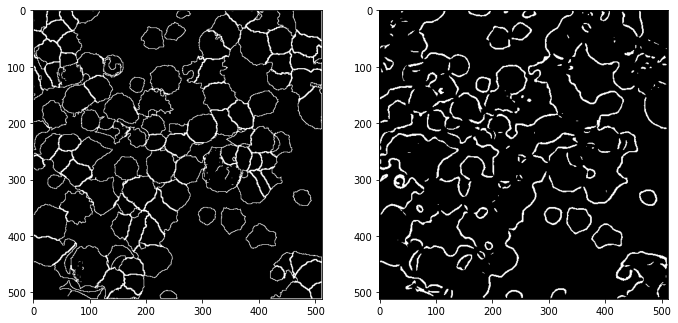

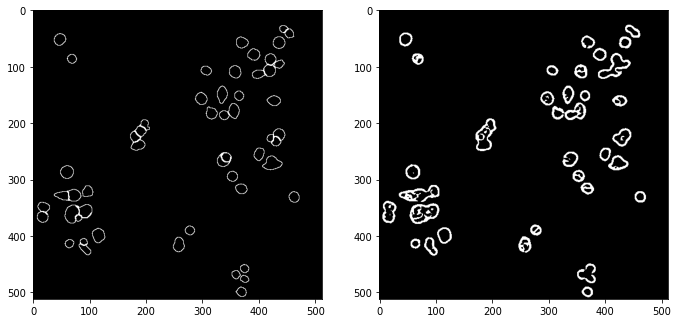

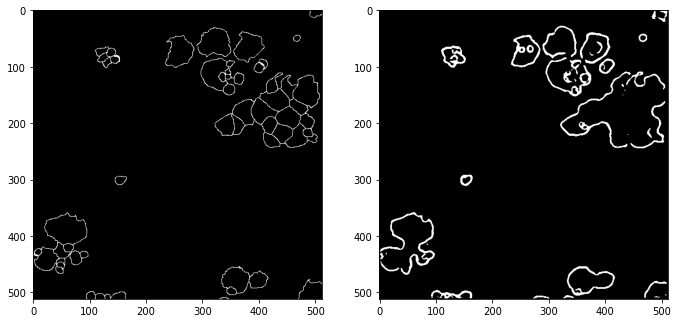

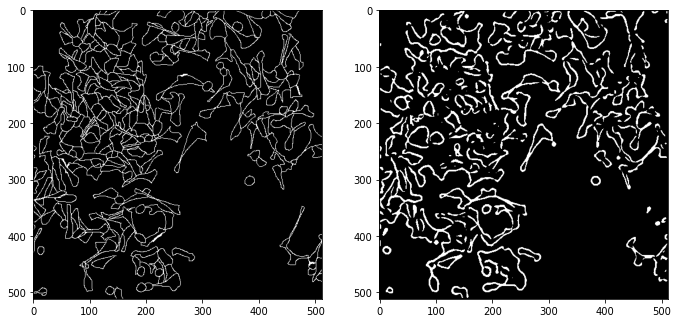

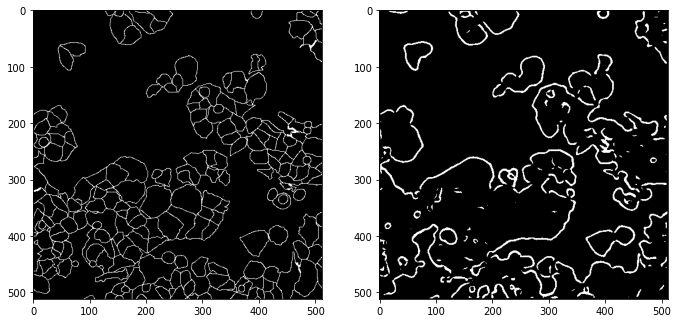

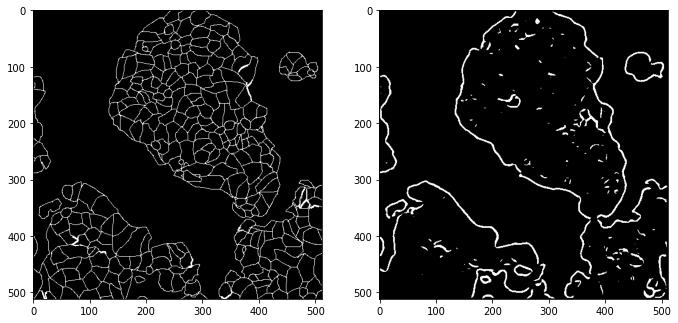

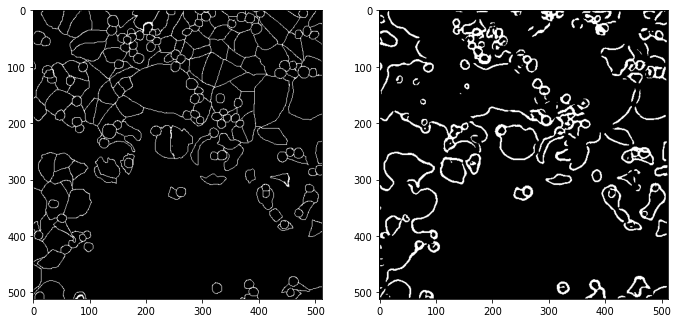

In [86]:
model.eval()
val_accuracy_batch_08 = []
val_accuracy_09 = []

for batch_no, (X_batch, y_batch) in tqdm(enumerate(val_batch_gen), total=len(val_batch_gen), desc="val "):
    X_batch, y_batch = X_batch.to(device), y_batch.to(device)
    logits = model(X_batch)
    
    img_orig = y_batch.data[0, 0].cpu()
    img_orig = img_orig.numpy()
    img = logits.data[0, 0].cpu()
    img = img.numpy()

    plt.figure(figsize=(3 * 3, 3.5 * 2))
    plt.subplots_adjust(bottom=0, left=.01, right=.99, top=.90, hspace=.35)
    plt.subplot(121)
    plt.imshow(img_orig, cmap=plt.get_cmap('gray'))
    plt.subplot(122)
    plt.imshow(img > 0.85, cmap=plt.get_cmap('gray'))
    plt.show()

    accuracy_08 = calc_iou_torch(logits > 0.85, y_batch)

    val_accuracy_batch_08.append(accuracy_08.item())
    val_accuracy_overall_08 = np.mean(val_accuracy_batch_08) * 100
    val_accuracy_08.append(val_accuracy_overall_08.item())

The final accuracy:

In [87]:
val_accuracy_overall_08.item()

22.64695657151086

# Part 2. Deep Image Prior (DIP) — 10 points


### Theory

Deep Image Prior [1] can be viewed as an implicit conditional generative model:

\begin{equation}
p(x \mid x_0) = \int p(x \mid \theta, \mathcal{z}, x_0)\, p(\theta \mid x_0)\, p(\mathcal{z})\,d\theta\,d\mathcal{z}\,,
\end{equation}

Latent parameters of this model consist of the weights of the neural network $\theta$ and a fixed input $\mathcal{z}$, which is fed into the network. 

If we denote the network by $f$, the output $x$ is produced in the following way:

$$
x = f_\theta(\mathcal{z}).
$$

This this model is implicit: we cannot evaluate the integral above. In the case of DIP, both likelihood and prior are unknown. But, as with all implicit models, we can perform sampling from $p(x \mid x_0)$.

Similarly to style transfer models, the sampling is done via optimization. The algorithm is following:

1. Sample a data point $x_0$ from a data distribution.
2. Initialize $\theta$ with $\theta_0$ and $\mathcal{z}$ with $z$.
3. Perform an optimization of some error function $E$ with respect to the weights of the neural network: 

$$
\min_\theta E(f_\theta(z), x_0).
$$

4. Hand-pick the weights $\theta_M$ at intermediate optimization step $M$ and denote them as $\theta^*$

Now, the most counter-intuitive thing about this model is the fact that it can be used for image restoration (inpainting, denoising) and super-resolution. In this case, $x_0$ is a degraded version of a target image $x$. And, by trying to predict this degraded image using a network (via minimization of an error between the predicted image $f_\theta(z)$ and $x_0$) at some optimization step $M$ we will obtain its restored or upscaled version.

The main trick is that instead of optimizing with respect to an input tensor $z$, like in style-transfer models, we keep the input fixed and optimize with repect to the weights of the network. Brief explanation of this result is provided below, for more details please refer to [1].

On one hand, a convolutional neural network is close to a universal functional approximator, and, given enough training iterations, it can fit a manifold of arbitrary complexity [2]. On the other hand, it is observed in practice that early stopping leads to solutions with good generalization (same networks, as in [2], can be properly trained to achieve good generalization). In DIP paper this phenomena is explored for image synthesis, and it was shown that the same intuition about generalization also applies here. Remarkably though, the generalization results were obtained for a highly complex manifold of natural images, which once again shows how well-suited are convolutional neural networks for image processing and synthesis.

### Task

The general goal of the task is for you to reproduce the results from the paper:

using a Mean Square Error (MSE) as an error function,

1. perform denoising of the images in the folder "data/denoising",
2. perform inpaiting of the images in the folder "data/inpaiting" (for inpainting, apply the loss only over the known area of the image using a provided mask),

with a UNet-style network (with 4 downsampling layers, and 16, 32, 64 and 128 filters at the end of each block).

For architecture reference, please read this blog post:
https://towardsdatascience.com/unet-line-by-line-explanation-9b191c76baf5.

If you have used a UNet-style network in the first part of the assignment on segmentation, you can reuse the code.

### Notes

- You have to play with the number of iterations $M$ used for early stopping, and use the optimal value to denoise and inpaint the images from the task. For each task you may need to find different optimal values. The source code and the results of your experiments should be provided in this notebook.
- Use Adam as your default optimizer, but feel free to experiment with the other optimizers or even architectures of the network. The most thorough experiments will be graded with bonus points. The final score for the homework is calculated as $\min ( \text{points} + \text{bonus_points}, \text{max_points} ) $.

### References

[1] Ulyanov et. al., "Deep Image Prior", CVPR 2018, https://arxiv.org/abs/1711.10925

[2] Zhang et. al., "Understanding deep learning requires rethinking generalization", ICLR 2017, https://arxiv.org/abs/1611.03530

In [88]:
! rm ./data -rf

### Download the dataset ###
!wget https://www.dropbox.com/s/si5o4dp4qa59cyy/data.zip?dl=0 -O data.zip
!unzip -q data.zip

! mkdir data/denoising/0 && mv data/denoising/* data/denoising/0
! mkdir data/inpainting/0 && mv data/inpainting/* data/inpainting/0

--2020-05-12 14:08:18--  https://www.dropbox.com/s/si5o4dp4qa59cyy/data.zip?dl=0
Resolving www.dropbox.com (www.dropbox.com)... 162.125.65.1, 2620:100:6018:1::a27d:301
Connecting to www.dropbox.com (www.dropbox.com)|162.125.65.1|:443... connected.
HTTP request sent, awaiting response... 301 Moved Permanently
Location: /s/raw/si5o4dp4qa59cyy/data.zip [following]
--2020-05-12 14:08:19--  https://www.dropbox.com/s/raw/si5o4dp4qa59cyy/data.zip
Reusing existing connection to www.dropbox.com:443.
HTTP request sent, awaiting response... 302 Found
Location: https://uce363e0fd4129d03891eb88fec3.dl.dropboxusercontent.com/cd/0/inline/A3n-anxyVwPQY62cLeVDIwYikXdJ6nmlT1KB09JXvjvo_X1EgvBpipAN1jM0pfXblG6uFVvpZgbehwdfkxanHMCg9zeoziSs6-hPXXNQLprAwWfPI54By3fwG3HWsTKC5Og/file# [following]
--2020-05-12 14:08:19--  https://uce363e0fd4129d03891eb88fec3.dl.dropboxusercontent.com/cd/0/inline/A3n-anxyVwPQY62cLeVDIwYikXdJ6nmlT1KB09JXvjvo_X1EgvBpipAN1jM0pfXblG6uFVvpZgbehwdfkxanHMCg9zeoziSs6-hPXXNQLprAwWfPI54By3f

In [0]:
# YOUR CODE HERE

In [90]:
import os

from tqdm.notebook import tqdm    # run this in Colab
# from tqdm import tqdm               # or this in Jupyter instead

import torch
from torch import nn
from torch.utils.data import DataLoader
from torch.utils.tensorboard import SummaryWriter

import torchvision
from torchvision import transforms

from datetime import datetime

!pip install einops
from einops import rearrange

import matplotlib.pyplot as plt
import numpy as np
import skimage
from skimage import io
%matplotlib inline

import random

In [0]:
device = torch.device("cuda") if torch.cuda.is_available() else torch.device("cpu")
random.seed(500)
data_dir = "data"

transform = transforms.Compose([
    transforms.ToTensor(),
])

In [0]:
# from seminar_photo2map_solution.ipynp
def imshow(img):
    # img = img / 2 + 0.5  # unnormalize
    img = img.cpu().numpy()
    
    # img_reshaped = np.transpose(img, (1, 2, 0))

    # below we use einops.rearrange. You can read about this neat library here: https://github.com/arogozhnikov/einops/blob/master/docs/1-einops-basics.ipynb
    img_reshaped = rearrange(img, 'channels height width -> height width channels')
    
    plt.imshow(img_reshaped)
    plt.show()

In [96]:
X_denoising = torchvision.datasets.ImageFolder(os.path.join(data_dir, "denoising"), 
                                               transform=transform)
X_inpainting = torchvision.datasets.ImageFolder(os.path.join(data_dir, "inpainting"), 
                                                transform=transform)
X_denoising = [i[0] for i in X_denoising]
X_inpainting = [i[0] for i in X_inpainting]

inpainting_dataset = [(X_inpainting[1], X_inpainting[0] * X_inpainting[1]),
                      (X_inpainting[3], X_inpainting[2] * X_inpainting[3]),
                      (X_inpainting[5], X_inpainting[4] * X_inpainting[5])]

print (len(X_denoising), len(X_inpainting))

2 6


In [0]:
# UNetDownBlock: Conv + ReLU + Conv + ReLU + MaxPool
# Convolution block: conv + batch norm + leaky ReLU + (up/downsample)

class UnetDownBlock(nn.Module):
    def __init__(self, in_channels, out_channels, pooling=True):
        super().__init__()
        
        self.convs = nn.Sequential(
            nn.Conv2d(in_channels, out_channels, kernel_size=3, padding=1),
            nn.LeakyReLU(),
            nn.BatchNorm2d(out_channels),
            nn.Conv2d(out_channels, out_channels, kernel_size=3, padding=1),
            nn.LeakyReLU(),
            nn.BatchNorm2d(out_channels),
        )
        self.maxpool = nn.MaxPool2d(kernel_size=2)
        
    def forward(self, x):
        # x: a tensor of shape (batch_size, in_channels, layer_height, layer_width)
        
        out_before_pooling = self.convs(x)
        out = self.maxpool(out_before_pooling)
        return out, out_before_pooling

In [0]:
# UNetUpBlock: upsampling + concat + Conv + ReLU
# Convolution block: conv + batch norm + leaky ReLU + (up/downsample)
# Use UNet with instance normalization layers, or, alternatively, don't put your 
# BatchNorm-s into eval mode, since batch size is too small for adequate running 
# statistics to be calculated

class UnetUpBlock(nn.Module):
    def __init__(self, in_channels, out_channels):
        super().__init__()
        
        self.upsample = nn.Upsample(scale_factor=2)
        self.convs = nn.Sequential(
            nn.Conv2d(in_channels * 2, out_channels, kernel_size=3, padding=1),
            nn.LeakyReLU(),
            nn.BatchNorm2d(out_channels),
            nn.Conv2d(out_channels, out_channels, kernel_size=3, padding=1),
            nn.LeakyReLU(),
            nn.BatchNorm2d(out_channels),
        )
        
    def forward(self, x, x_bridge):
        # x: a tensor of shape (batch_size, in_channels, layer_height // 2, layer_width // 2)
        # x_bridge: a tensor of shape (batch_size, in_channels, layer_height, layer_width)
        
        x_up = self.upsample(x)
        x_concat = torch.cat([x_up, x_bridge], dim=1)
        out = self.convs(x_concat)
        
        return out

In [0]:
### Let's make a UNet with 4 levels and 16, 32, 64 and 128 channels
### (n_base_channels=16)

class Unet_DIP(nn.Module):
    def __init__(self, n_base_channels=16):
        super().__init__()

        self.down_blocks = nn.ModuleList([
            UnetDownBlock(3, n_base_channels),                        # 16
            UnetDownBlock(n_base_channels, n_base_channels * 2),      # 32
            UnetDownBlock(n_base_channels * 2, n_base_channels * 4),  # 64
            UnetDownBlock(n_base_channels * 4, n_base_channels * 8),  # 128
            UnetDownBlock(n_base_channels * 8, n_base_channels * 8)   # 128
        ])

        self.up_blocks = nn.ModuleList([
            UnetUpBlock(n_base_channels * 8, n_base_channels * 4),    # 64
            UnetUpBlock(n_base_channels * 4, n_base_channels * 2),    # 32
            UnetUpBlock(n_base_channels * 2, n_base_channels),        # 16
            UnetUpBlock(n_base_channels, n_base_channels),            # 16
        ])

        self.final_block = nn.Sequential(
            #  nn.Conv2d(n_base_channels, 3, kernel_size=1, padding=0),
            nn.Conv2d(n_base_channels, 3, kernel_size=3, padding=1),
            nn.Sigmoid()
        )
            
    def forward(self, x):
        out = x
        outputs_before_pooling = []
        for i, block in enumerate(self.down_blocks):
            out, before_pooling = block(out)
            outputs_before_pooling.append(before_pooling)
            # easy mistake can be made here: for last layer, we need to save out_before_pooling
        out = before_pooling

        # now outputs_before_pooling = [block1_before_pooling, ..., block5_before_pooling]
        
        for i, block in enumerate(self.up_blocks):    # NB: it's easier to understand when using counter (i=3, etc.)
            out = block(out, outputs_before_pooling[-i - 2])
        out = self.final_block(out)
        
        return out

In [397]:
%load_ext tensorboard
logs_base_dir = "./logs_DIP2"
os.makedirs(logs_base_dir, exist_ok=True)
%tensorboard --logdir {logs_base_dir}

The tensorboard extension is already loaded. To reload it, use:
  %reload_ext tensorboard


<IPython.core.display.Javascript object>

In [0]:
def train_inpainting(model, inpainting_dataset, n_epochs=2, lr=1e-2, exp_name='my_network'):
    criterion = nn.MSELoss()
    opt = torch.optim.Adam(model.parameters(), lr=lr) # start with 1e-2
    writer = SummaryWriter(f'logs_DIP2/{exp_name}')
    train_loss = []
    train_accuracy = []

    (mask, X0) = inpainting_dataset
    mask, X0 = mask[None, :, :, :], X0[None, :, :, :]
    X_from_noise = torch.randn(*X0.size())
    mask = mask.to(torch.bool)
    X0_masked = X0[mask]
    mask, X0_masked, X_from_noise = mask.to(device), X0_masked.to(device), X_from_noise.to(device)
    model.train()

    for epoch in tqdm(range(n_epochs), total=n_epochs):
        # for inpainting, apply the loss only over the known area of the image using a provided mask
        logits = model(X_from_noise)
        loss = criterion(logits[mask], X0_masked)
        opt.zero_grad()
        loss.backward()
        opt.step()
        
        writer.add_scalar("inpainting/loss", loss.item(), epoch)
        # writer.add_image('inpainting/X_from_noise', torchvision.utils.make_grid(logits), epoch)

    return logits

In [0]:
def train_denoising(model, denoising_dataset, n_epochs=2, lr=1e-2, exp_name='my_network'):
    criterion = nn.MSELoss()
    opt = torch.optim.Adam(model.parameters(), lr=lr) # start with 1e-2
    writer = SummaryWriter(f'logs_DIP2/{exp_name}')
    train_loss = []
    train_accuracy = []

    X0 = denoising_dataset[None, :, :, :]
    X_from_noise = torch.randn(*X0.size())*2
    X0, X_from_noise = X0.to(device), X_from_noise.to(device)
    model.train()

    for epoch in tqdm(range(n_epochs), total=n_epochs):
        logits = model(X_from_noise)
        loss = criterion(logits, X0)
        opt.zero_grad()
        loss.backward()
        opt.step()
        
        writer.add_scalar("denoising/loss", loss.item(), epoch)
        # writer.add_image('denoising/X_from_noise', torchvision.utils.make_grid(logits), epoch)

    return logits

I made a manual search over lr from 1e-1 to 1e-4 and n_epochs from 1000 to 30000-6000 and these parameters were the best: 

Inpainting:

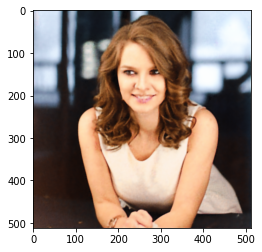

In [105]:
model_inpainting_kate = Unet_DIP(n_base_channels=16).to(device)
lr = 1e-2
exp_name = "kate" + datetime.now().isoformat(timespec='seconds') + f'exp{lr}'
logits_kate = train_inpainting(model_inpainting_kate, inpainting_dataset[0], n_epochs=1000, lr=lr, exp_name=exp_name)
imshow(logits_kate.data[0])

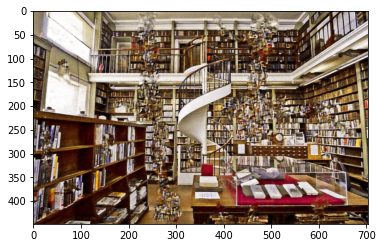

In [118]:
model_inpainting_library = Unet_DIP(n_base_channels=16).to(device)
lr = 1e-2
exp_name = "library" + datetime.now().isoformat(timespec='seconds') + f'exp{lr}'
logits_lib = train_inpainting(model_inpainting_library, inpainting_dataset[1], n_epochs=1200, lr=lr, exp_name=exp_name)
imshow(logits_lib.data[0])

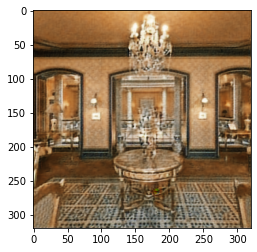

In [126]:
model_inpainting_vase = Unet_DIP(n_base_channels=16).to(device)
lr = 1e-1
exp_name = "vase" + datetime.now().isoformat(timespec='seconds') + f'exp{lr}'
logits_vase = train_inpainting(model_inpainting_vase, inpainting_dataset[2], n_epochs=1200, lr=lr, exp_name=exp_name)
imshow(logits_vase.data[0])

Denoising:

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


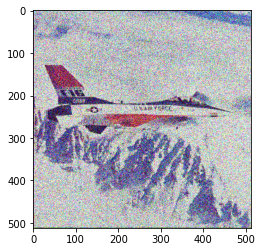

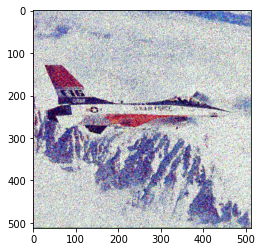

In [114]:
# Use Gaussian noise with reasonable sigma (20-30 if pixels are in [0, 255])
old = X_denoising[0].data
new = torch.randn(*X_denoising[0].size())*0.4
noised = old + new
imshow(noised)

model_denoising_F16_GT = Unet_DIP(n_base_channels=16).to(device)
lr = 1e-3
exp_name = "F16_GT" + datetime.now().isoformat(timespec='seconds') + f'exp{lr}'
logits_F16_GT = train_denoising(model_denoising_F16_GT, noised, n_epochs=6000, lr=lr, exp_name=exp_name)
imshow(logits_F16_GT.data[0])

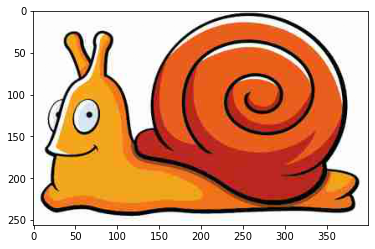

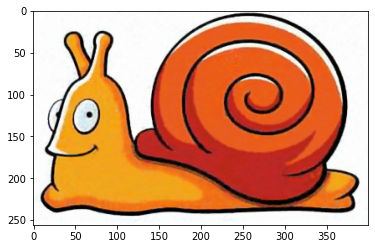

In [150]:
img_cut = X_denoising[1][:, 5:, :] # 261x400 - problems with maxpooling & upsampling dimensions
imshow(img_cut)

model_denoising_snail = Unet_DIP(n_base_channels=16).to(device)
lr = 1e-2
exp_name = "snail" + datetime.now().isoformat(timespec='seconds') + f'exp{lr}'
logits_snail = train_denoising(model_denoising_snail, img_cut, n_epochs=2400, lr=lr, exp_name=exp_name)
imshow(logits_snail.data[0])